# Advanced Lane Lines

In [1]:
#Import packages
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from glob import glob
from natsort import natsorted
from copy import deepcopy
%matplotlib inline

### Camera Calibration

Obtaining object and image points for camera calibration

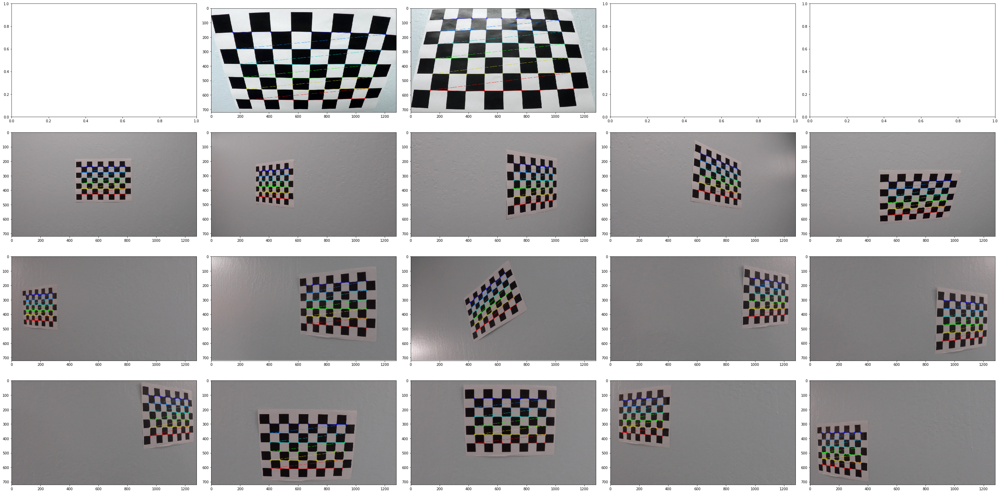

In [2]:
# prepare object points
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(8,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

fig, ax = plt.subplots(4, 5, figsize=(40, 20))
fig.tight_layout()
ax = np.ravel(ax)
i=-1

#Reading in the images in the directory
for pic in natsorted(glob('camera_cal/calibration*.jpg')):
    img = cv2.imread(pic)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    i += 1
    # If found, draw corners
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        ax[i].imshow(img)

Calibration images 1, 4, and 5 were not plotted since OpenCV couldn't find nx and ny chessboard corners in the image. These images are partially cut off and so, there are fewer corners in these images.

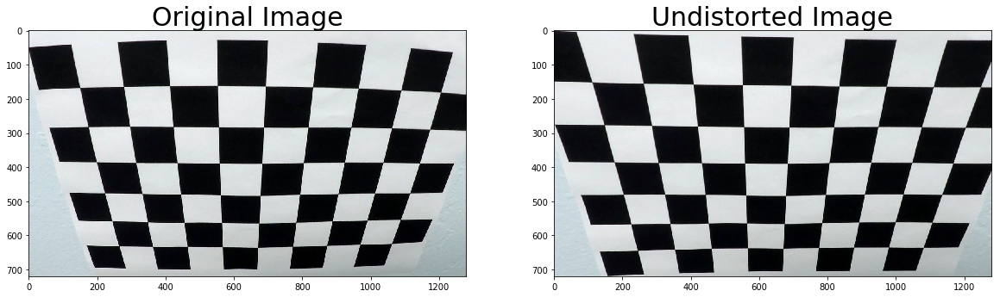

In [3]:
import pickle
%matplotlib inline

# Test undistortion on an image
img = cv2.imread('camera_cal/calibration2.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

def undistort(img, mtx, dist):
    img = cv2.undistort(img, mtx, dist, None, mtx)
    return img

dst = undistort(img, mtx, dist)
#cv2.imwrite('output_images/calibration2undistort.jpg',dst)

# Save the camera calibration result
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30);

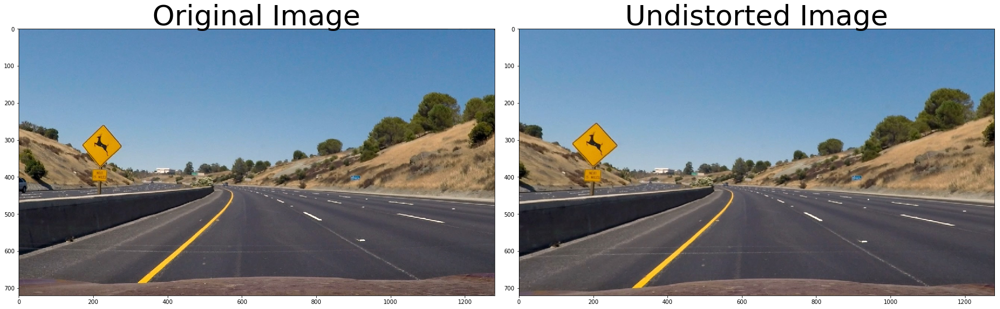

In [4]:
# Read in a test image and undistort
img = plt.imread('test_images/test2.jpg')

dst = undistort(img, mtx, dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
#cv2.imwrite('output_images/test2undistort.jpg',dst);

### Binary Threshold Images

Obtaining the binary threshold images by color and gradient thresholding.

In [5]:
#Change color scale of the image
def colorscale(img, color_scale = 'gray'):
    if color_scale == 'gray':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    elif color_scale == 'HLS':
        img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    return img
    
#Calculate directional gradient and apply threshold
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    if orient == 'x':
        sobel = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return grad_binary

#Calculate gradient magnitude and apply threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):   
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return mag_binary

#Calculate gradient direction and apply threshold
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):   
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_binary =  np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return dir_binary

#Threshold color channel
def color_threshold(img, thresh=(170, 255)):
    color_binary = np.zeros_like(img)
    color_binary[(img >= thresh[0]) & (img <= thresh[1])] = 1
    return color_binary

#Extract out the region of interest
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [6]:
# Read in a test image and undistort
img = plt.imread('test_images/test2.jpg')
img_gray = colorscale(img, color_scale = 'gray')

# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(img_gray, orient='x', sobel_kernel=ksize, thresh=(20, 100))
grady = abs_sobel_thresh(img_gray, orient='y', sobel_kernel=ksize, thresh=(20, 100))
mag_binary = mag_thresh(img_gray, sobel_kernel=ksize, mag_thresh=(30, 100))
dir_binary = dir_threshold(img_gray, sobel_kernel=ksize, thresh=(0.7, 1.3))

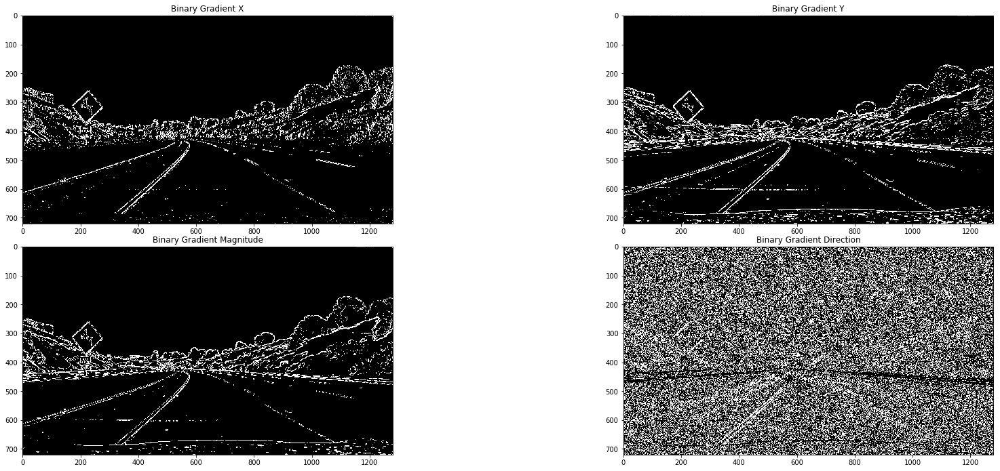

In [7]:
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

f, ax = plt.subplots(2, 2, figsize=(24, 9))
f.tight_layout()
ax = np.ravel(ax)
imgs = [gradx, grady, mag_binary, dir_binary]
titles = ['Binary Gradient X', 'Binary Gradient Y', 'Binary Gradient Magnitude', 'Binary Gradient Direction']
for i in range(len(imgs)):
    ax[i].imshow(imgs[i], cmap= 'gray')
    ax[i].set_title(titles[i], fontsize=12)
    plt.subplots_adjust(left=0., right=1, top=1.0, bottom=0.)

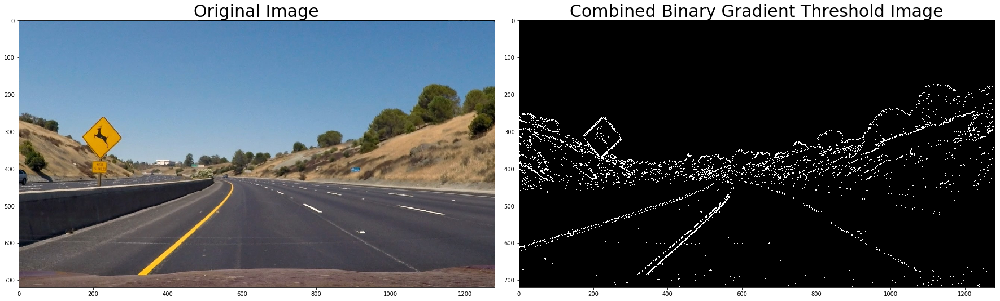

In [8]:
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(combined, cmap = 'gray')
ax2.set_title('Combined Binary Gradient Threshold Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#mpimg.imsave('output_images/test2binarythres1.jpg',combined, cmap = 'gray');

The yellow lane line was not detected in the combined binary threshold image for some of the test images. As a result, the image should be converted to HLS color map and a color threshold should be applied in order to reliably extract the yellow lane line.

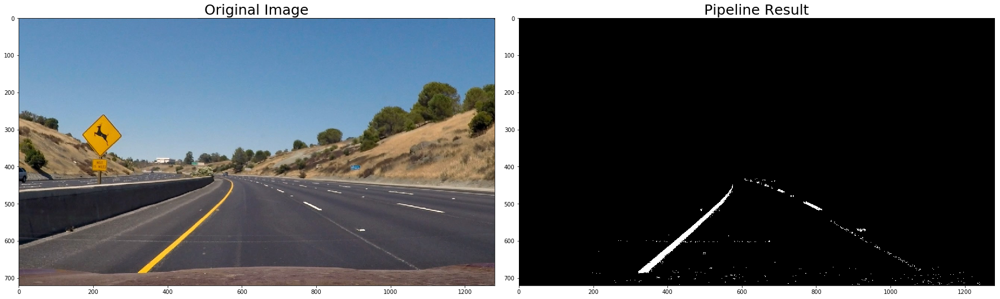

In [9]:
image = mpimg.imread('test_images/test2.jpg')

def pipeline(img):
    img_gray = colorscale(img, color_scale = 'gray')

    # Choose a Sobel kernel size
    ksize = 3 # Choose a larger odd number to smooth gradient measurements

    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(img_gray, orient='x', sobel_kernel=ksize, thresh=(20, 255))
    grady = abs_sobel_thresh(img_gray, orient='y', sobel_kernel=ksize, thresh=(60, 255))
    mag_binary = mag_thresh(img_gray, sobel_kernel=ksize, mag_thresh=(30, 255))
    dir_binary = dir_threshold(img_gray, sobel_kernel=ksize, thresh=(0.7, 1.3))
    
    combined1 = np.zeros_like(dir_binary)
    combined1[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    # Convert to HLS color space and separate the L and S channels
    hls = colorscale(img, color_scale = 'HLS')
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]

    # Sobel x
    #sxbinary = abs_sobel_thresh(l_channel, orient='x', sobel_kernel=3, thresh=(20, 100))

    # Threshold color channel
    s_binary = color_threshold(s_channel, thresh=(170, 255))
        
    #combined2 = np.zeros_like(s_binary)
    #combined2[((s_binary == 1) | (sxbinary == 1))] = 1
    
    combined = np.zeros_like(s_binary)
    combined[(combined1 == 1) | (s_binary == 1)] = 1
    
    # Stack each channel for visualization
    #color_binary = np.dstack(( np.zeros_like(s_binary), s_binary, gradx)) * 255
    
    imshape = combined.shape
    vertices = np.array([[(0,imshape[0]),(imshape[1]/2.1, imshape[0]/1.67), (2*imshape[1]/3.8, imshape[0]/1.67), (imshape[1],imshape[0])]], dtype=np.int32)
    masked_combined = region_of_interest(combined, vertices)
    
    return masked_combined
    
result = pipeline(image)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=25)

ax2.imshow(result, cmap = 'gray')
ax2.set_title('Pipeline Result', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#mpimg.imsave('output_images/test2binarythres3ROI.jpg', result, cmap = 'gray')

### Perspective Transformation of Lane Lines

Performing perspective transformation on the lane lines to get a bird's eye view.

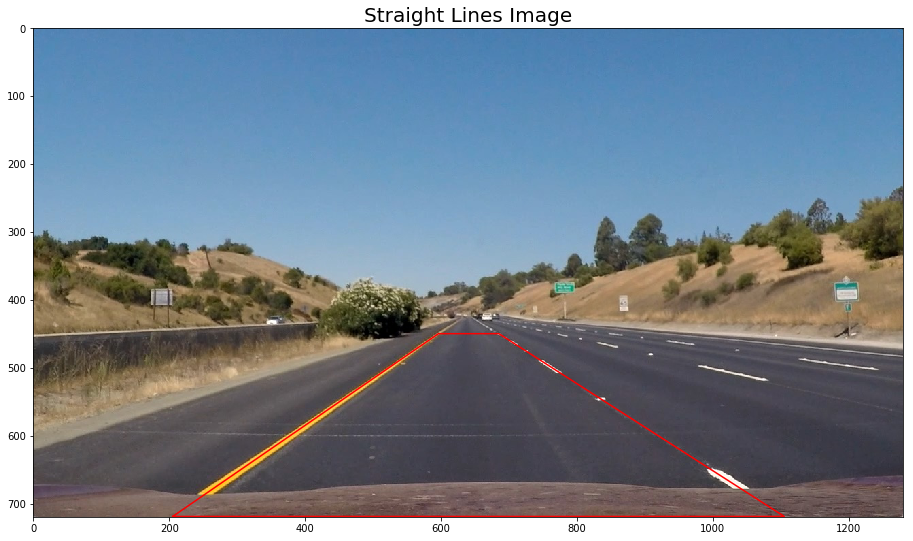

In [10]:
#Find points on lane lines to perform perspective transform
straight_img = mpimg.imread('test_images/straight_lines1.jpg')

sizey, sizex, channels = straight_img.shape
coord = [[205, sizey-1], [596, 450], [685,450], [1105, sizey-1]]
coord.append(coord[0]) #repeat the first point to create a 'closed loop'

xs, ys = zip(*coord) #create lists of x and y values

plt.figure(figsize = (24,9))
plt.imshow(straight_img, cmap = 'gray')
plt.plot(xs,ys, color='red')
plt.title('Straight Lines Image', fontsize=20);
plt.savefig('output_images/straight_lines1perspectpts.jpg')

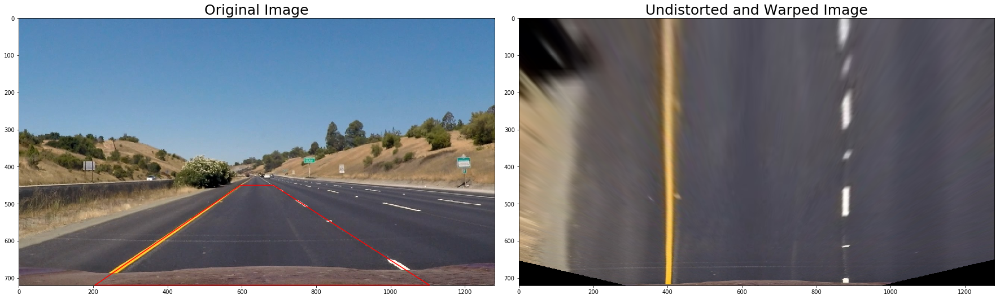

In [11]:
#Perform unwarp and perspective transformation on an image

def unwarp_transform(img, mtx, dist):
    img = undistort(img, mtx, dist)
    warped = np.copy(img)
    img_size = (img.shape[1], img.shape[0])
    src = np.float32([[205, img_size[1]-1], [596, 450], [685,450], [1105, img_size[1]-1]])
    #src =np.float32([[205, img_size[1]-1], [560, 475], [725,475], [1105, img_size[1]-1]])
    offset=400
    dst = np.float32([[offset, img_size[1]], [offset, 0], 
                        [img_size[0]-offset, 0], 
                     [img_size[0]-offset, img_size[1]]])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(warped, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M, Minv, src

top_down1, perspective_M, Minv, src = unwarp_transform(straight_img, mtx, dist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(straight_img, cmap = 'gray')
src=list(src)
src.append(src[0]) #repeat the first point to create a 'closed loop'
xs, ys = zip(*src) #create lists of x and y values
ax1.plot(xs,ys, color='red')

ax1.set_title('Original Image', fontsize=25)
ax2.imshow(top_down1, cmap = 'gray')
ax2.set_title('Undistorted and Warped Image', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
#fig.savefig('output_images/straight_lines1warped.jpg')
mpimg.imsave('output_images/straight_lines1warped.jpg', top_down1)

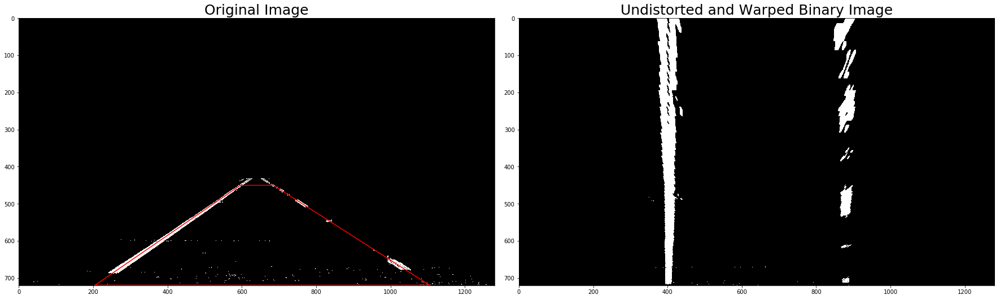

In [12]:
result = pipeline(straight_img)
top_down1, perspective_M, Minv, src = unwarp_transform(result, mtx, dist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(result, cmap = 'gray')
src=list(src)
src.append(src[0]) #repeat the first point to create a 'closed loop'
xs, ys = zip(*src) #create lists of x and y values
ax1.plot(xs,ys, color='red')
ax1.set_title('Original Image', fontsize=25)
ax2.imshow(top_down1, cmap = 'gray')
ax2.set_title('Undistorted and Warped Binary Image', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
mpimg.imsave('output_images/straight_lines1warpedbinary.jpg', top_down1, cmap = 'gray')

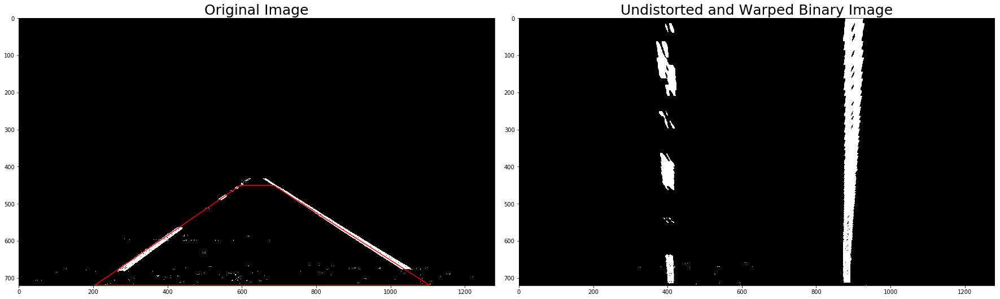

In [13]:
#Find points on lane lines to perform perspective transform
straight_img2 = mpimg.imread('test_images/straight_lines2.jpg')
result = pipeline(straight_img2)
top_down2, perspective_M, Minv, src = unwarp_transform(result, mtx, dist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(result, cmap = 'gray')
src=list(src)
src.append(src[0]) #repeat the first point to create a 'closed loop'
xs, ys = zip(*src) #create lists of x and y values
ax1.plot(xs,ys, color='red')
ax1.set_title('Original Image', fontsize=25)
ax2.imshow(top_down2, cmap = 'gray')
ax2.set_title('Undistorted and Warped Binary Image', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

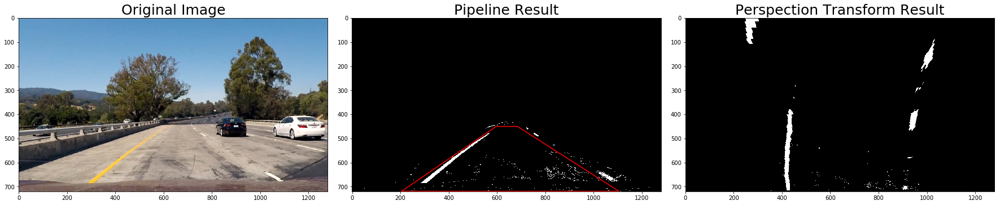

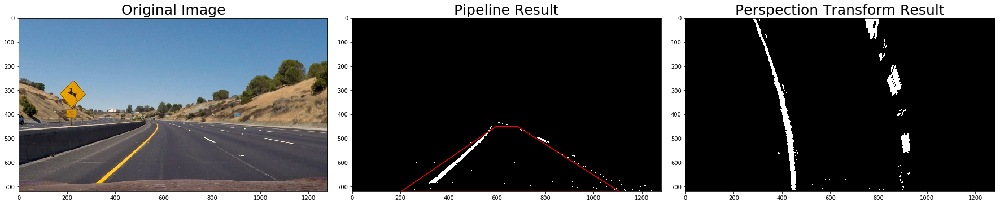

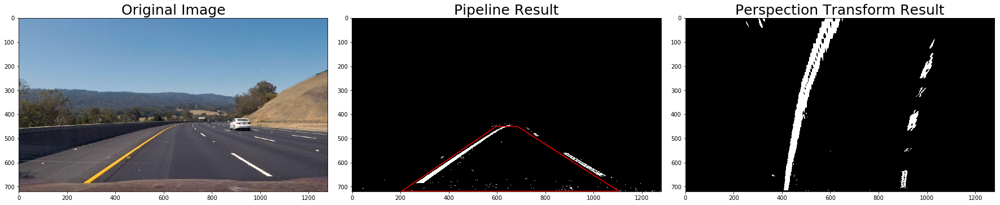

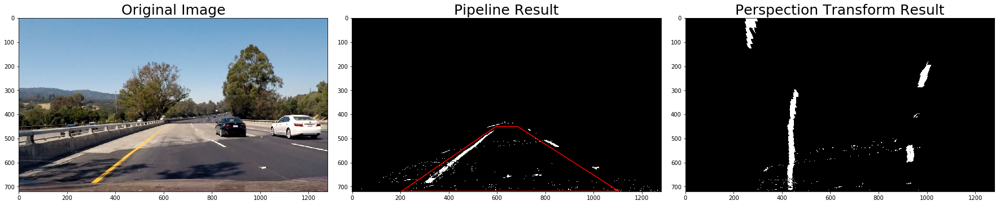

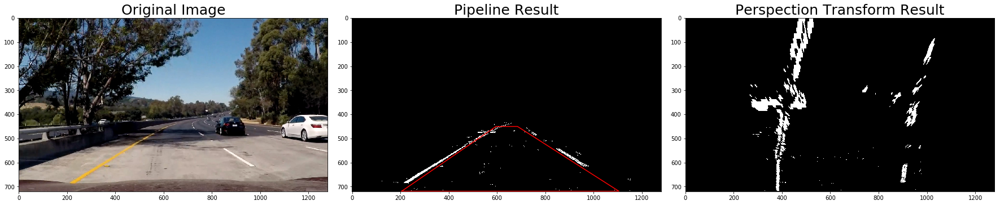

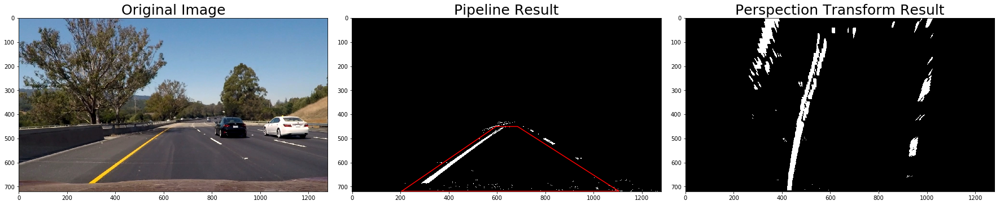

In [14]:
for pic in natsorted(glob('test_images/test*.jpg')):
    img = mpimg.imread(pic)
    result = pipeline(img)
    top_down, perspective_M, Minv, src = unwarp_transform(result, mtx, dist)

    # Plot the result
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=25)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=25)
    src=list(src)
    src.append(src[0]) #repeat the first point to create a 'closed loop'
    xs, ys = zip(*src) #create lists of x and y values
    ax2.plot(xs,ys, color='red')
    
    ax3.imshow(top_down, cmap='gray')
    ax3.set_title('Perspection Transform Result', fontsize=25)
   
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Lane Line Detection and Fitting

In [15]:
#Function to fit lane lines to the image
def fit_lines(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    return out_img, left_fitx, right_fitx, ploty, right_fit, left_fit

#Function to visualize lane lines detected onto binary warped image
def VisualLines(binary_warped):
    out_img, left_fitx, right_fitx, ploty, right_fit, left_fit = fit_lines(binary_warped)
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)

In [31]:
'''
img = mpimg.imread('test_images/test2.jpg')
result = pipeline(img)
top_down, perspective_M, Minv, src = unwarp_transform(result, mtx, dist)
binary_warped = top_down
out_img, left_fitx, right_fitx, ploty, right_fit, left_fit = fit_lines(binary_warped)
mpimg.imsave('output_images/lanelines.jpg', out_img)
''';

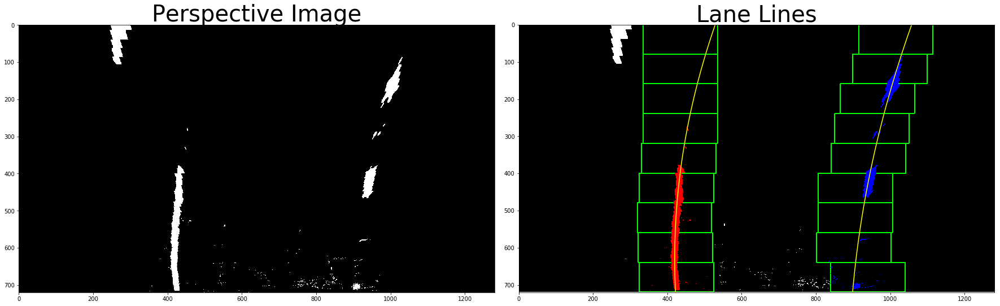

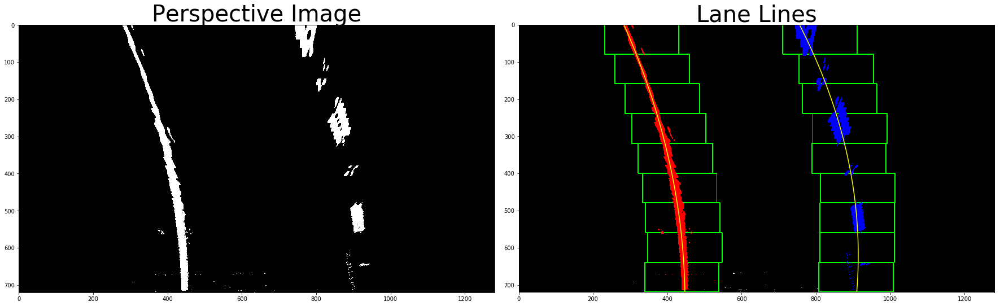

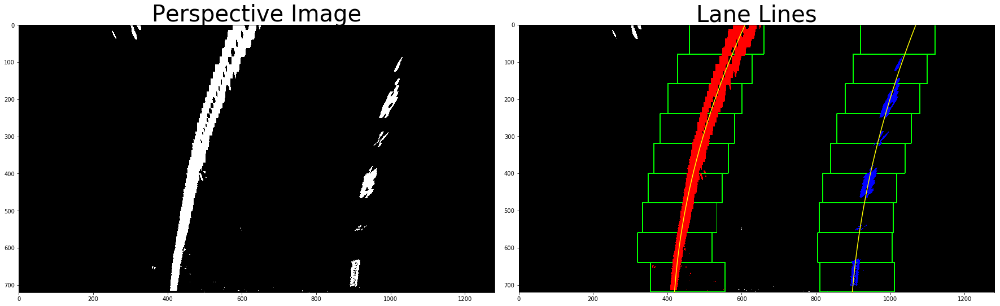

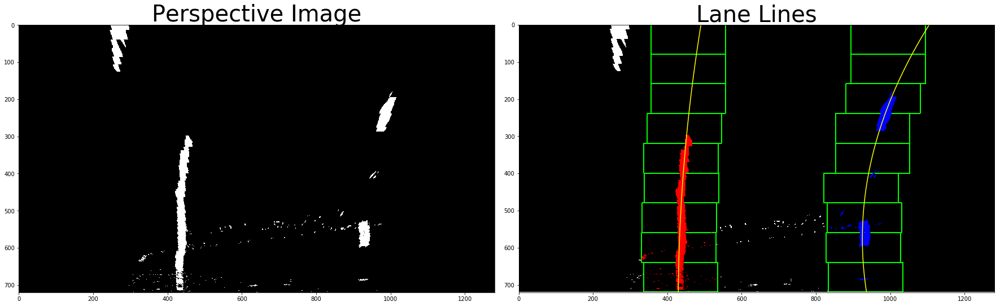

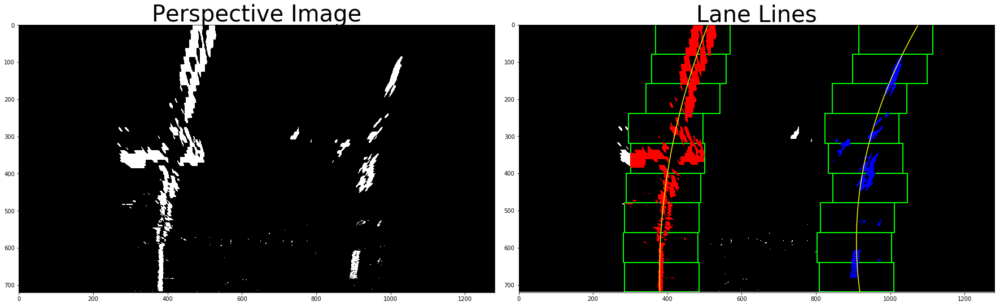

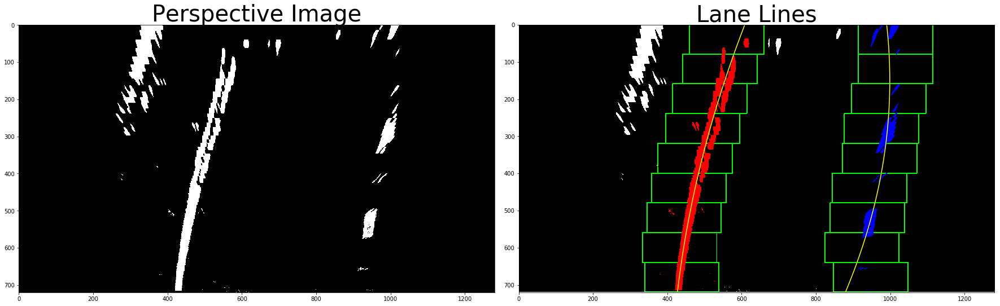

In [17]:
# Identifying the lane lines in the test images
for pic in natsorted(glob('test_images/test*.jpg')):
    img = mpimg.imread(pic)
    result = pipeline(img)
    top_down, perspective_M, Minv, src = unwarp_transform(result, mtx, dist)
    binary_warped = top_down

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(top_down, cmap = 'gray')
    ax1.set_title('Perspective Image', fontsize=40)
    
    VisualLines(binary_warped)
    ax2.set_title('Lane Lines', fontsize=40)

    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [18]:
#Find lane lines in the next frame from previous fit

def fit_nextline(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return result, left_fitx, right_fitx, ploty, right_fit, left_fit

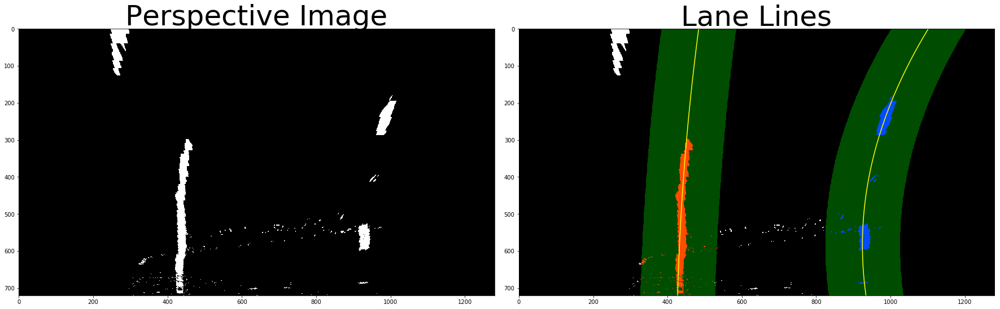

In [19]:
#Identifying the lane lines in a new image using fit from the previous image
test_img1 = mpimg.imread('test_images/test3.jpg')
result = pipeline(test_img1)
top_down, perspective_M, Minv, src = unwarp_transform(result, mtx, dist)
binary_warped = top_down
out_img, left_fitx, right_fitx, ploty, right_fit, left_fit = fit_lines(binary_warped)

test_img2 = mpimg.imread('test_images/test4.jpg')
result = pipeline(test_img2)
top_down2, perspective_M, Minv, src = unwarp_transform(result, mtx, dist)
binary_warped = top_down2
result, left_fitx, right_fitx, ploty, right_fit, left_fit = fit_nextline(binary_warped, left_fit, right_fit)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(binary_warped, cmap = 'gray')
ax1.set_title('Perspective Image', fontsize=50)
ax2.imshow(result, cmap = 'gray')
ax2.plot(left_fitx, ploty, color='yellow')
ax2.plot(right_fitx, ploty, color='yellow')
ax2.set_title('Lane Lines', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Calculate Lane Information and Overlay Lanes Lines onto Images

In [20]:
#Function to calculate the radius of curvature in the lane lines and the vehicle position from the center
def Radius_CenterDist(img, ploty, left_fitx, right_fitx):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = float(30/720) # meters per pixel in y dimension
    xm_per_pix = float(3.7/700) # meters per pixel in x dimension
    y_eval = np.max(ploty)

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    camera_center = img.shape[1]/2*xm_per_pix
    y_end = img.shape[0]*ym_per_pix
    left_x = left_fit_cr[0]*(y_end)**2 + left_fit_cr[1]*y_end + left_fit_cr[2]
    right_x = right_fit_cr[0]*(y_end)**2 + right_fit_cr[1]*y_end + right_fit_cr[2]
    lane_center = 0.5*(left_x + right_x)   
    center_dist = (camera_center - lane_center)
    
    return left_curverad, right_curverad, center_dist, left_fit_cr, right_fit_cr

In [21]:
#Function to overlay the lane lines and lane information onto image
def VisualonImage(image, warped, Minv, left_fitx, right_fitx, ploty):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    undist = image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    left_curverad, right_curverad, center_dist, left_fit_cr, right_fit_cr = Radius_CenterDist(image ,ploty, left_fitx, right_fitx)
    avg_radius = 0.5*(left_curverad + right_curverad)/1000
    text = 'Curve Radius: {:.2f}'.format(avg_radius)+'km'
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,text,(10,50), font, 1,(255,255,255),2,cv2.LINE_AA)
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    else:
        direction = 'center'
    text2 = 'Distance from centre: {:.0f}'.format(abs(center_dist)*100)+'cm ' + '(' + direction + ')'
    cv2.putText(result,text2,(10,100), font, 1,(255,255,255),2,cv2.LINE_AA)
    return result, left_curverad, right_curverad, center_dist

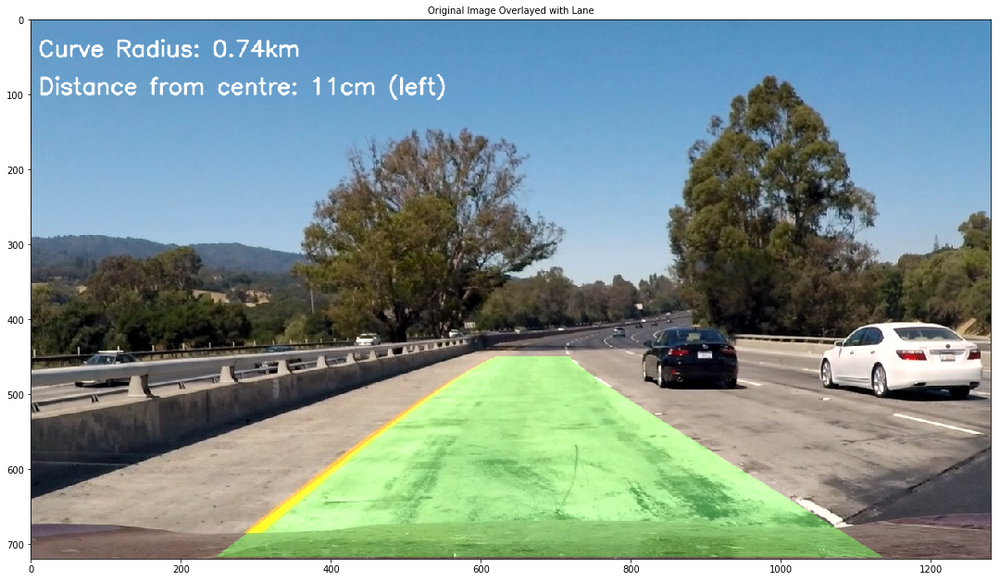

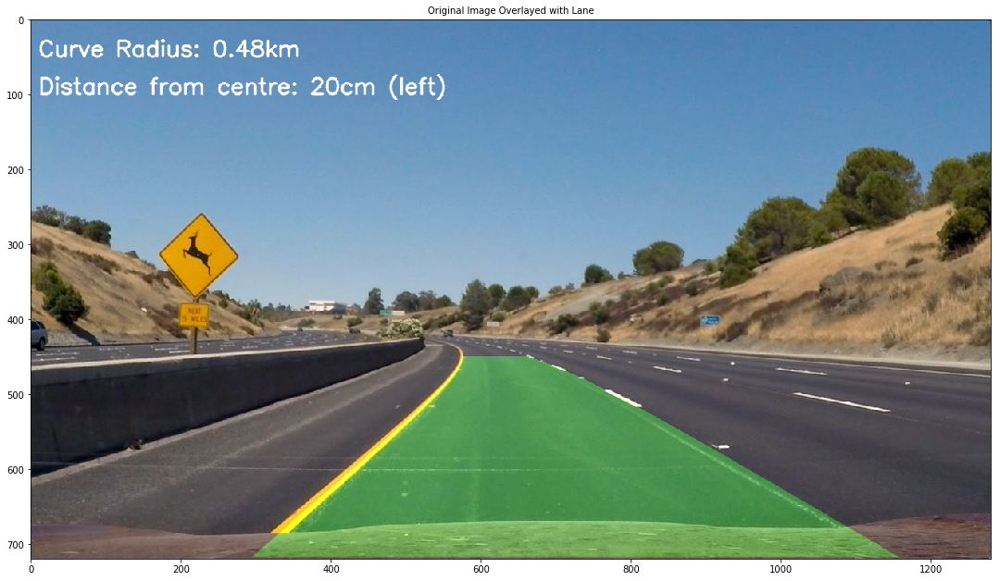

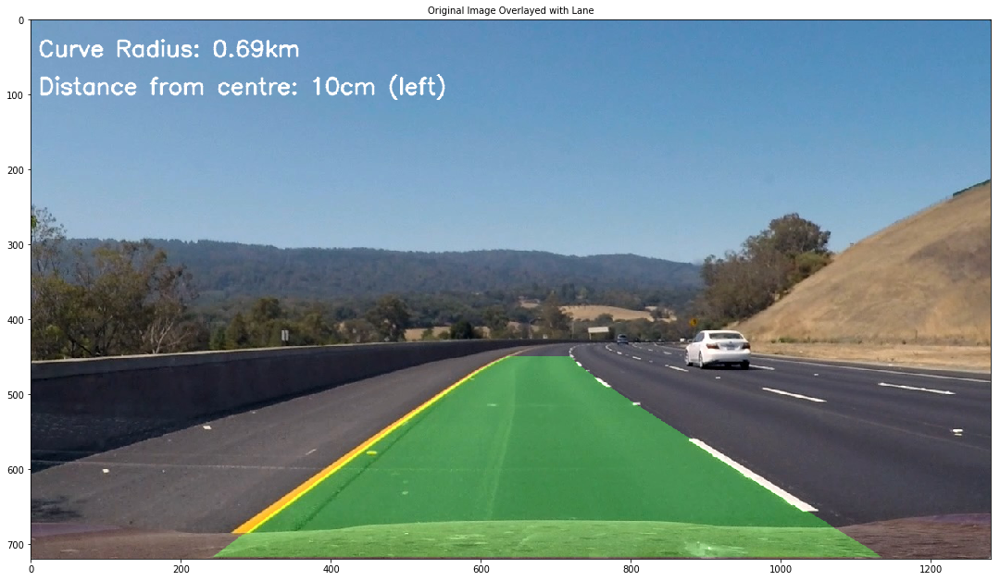

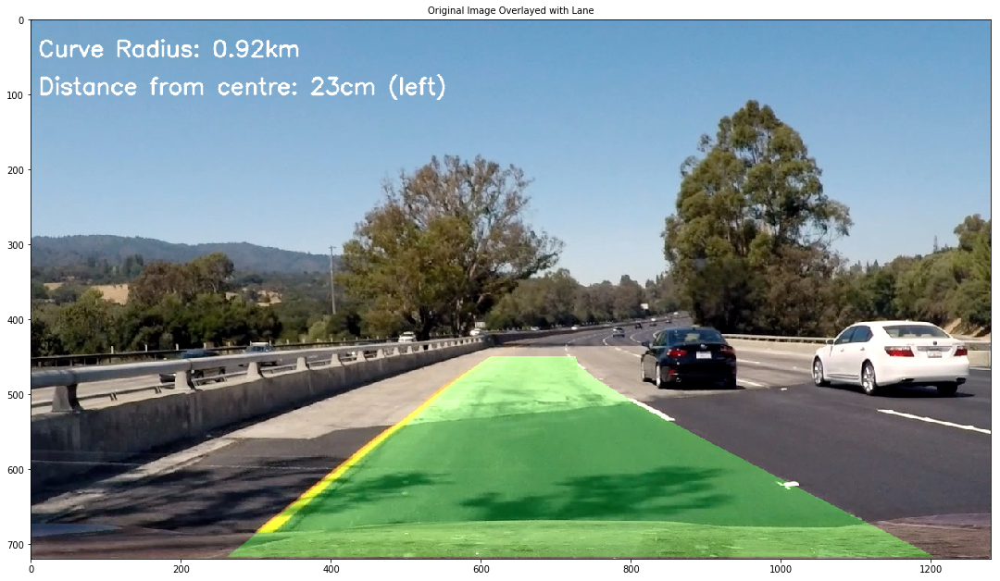

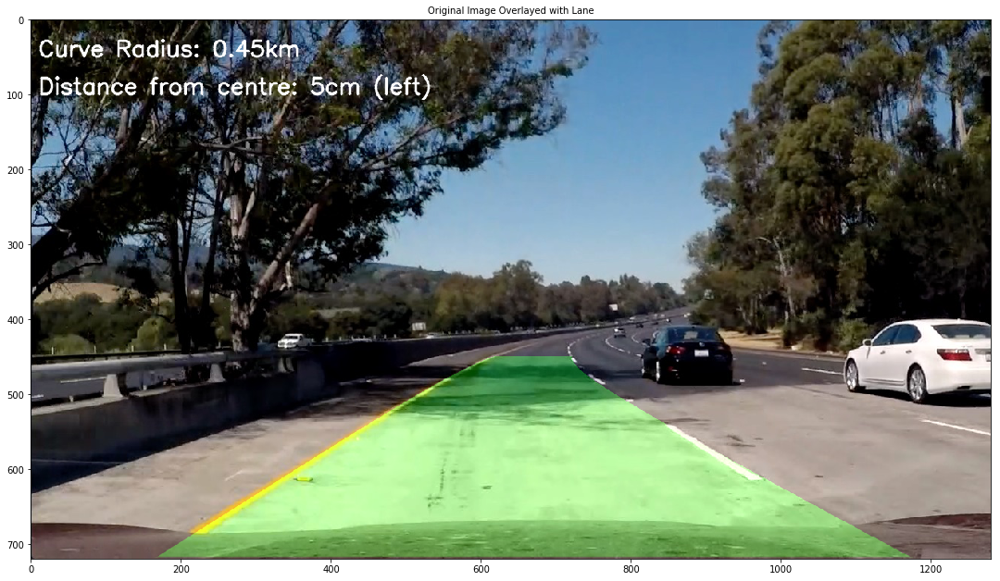

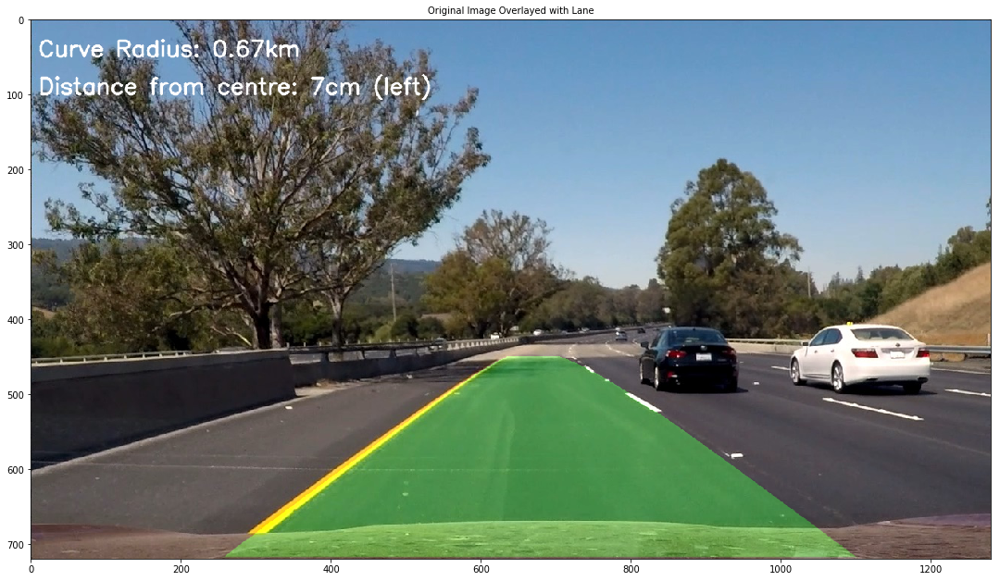

In [22]:
# Overlay lane lines and lane information onto the test images
#i = 0
for pic in natsorted(glob('test_images/test*.jpg')):
    img = mpimg.imread(pic)
    result = pipeline(img)
    top_down, perspective_M, Minv, src = unwarp_transform(result, mtx, dist)
    binary_warped = top_down
    out_img, left_fitx, right_fitx, ploty, right_fit, left_fit= fit_lines(binary_warped)
    final, left_curverad, right_curverad, center_dist = VisualonImage(img, binary_warped, Minv, left_fitx, right_fitx, ploty)
    
    # Plot the result
    f, ax1 = plt.subplots(1, 1, figsize=(24, 9))
    f.tight_layout()
    
    ax1.set_title('Original Image Overlayed with Lane', fontsize=10)
    ax1.imshow(final)

    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    '''
    i += 1
    if i==2:
        mpimg.imsave('output_images/test2final.jpg', final)
    '''

### Video Processing

In [23]:
#Visual lane lines and lane information onto video frames
def VisualonVideo(image, warped, Minv, left_fitx, right_fitx, ploty, left_curverad, right_curverad, center_dist):
    global rlane
    global llane
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    undist = image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    avg_radius = 0.5*(left_curverad + right_curverad)/1000
    text = 'Curve Radius: {:.2f}'.format(avg_radius)+'km'
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,text,(10,50), font, 1,(255,255,255),2,cv2.LINE_AA)
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    else:
        direction = 'center'
    text2 = 'Distance from centre: {:.0f}'.format(abs(center_dist)*100)+'cm ' + '(' + direction + ')'
    cv2.putText(result,text2,(10,100), font, 1,(255,255,255),2,cv2.LINE_AA)
    return result

In [24]:
# Define a class to receive the characteristics of each line detection
class Line():
    
    n = 5 #Number of frames to smooth x-fitted data
    
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        #Change to 1 after first frame
        self.first_iter = 0
    
    def Update(self, fit, fitx, y, radius):
        self.diffs = self.current_fit - fit
        self.current_fit = fit
        self.recent_xfitted.append(fitx)
        if len(self.recent_xfitted) > self.n:
            self.recent_xfitted.pop(0)
        self.bestx = np.mean(self.recent_xfitted, axis=0)
        self.allx = fitx
        self.ally = y
        self.radius_of_curvature = radius
        self.first_iter = 1

In [25]:
#Function to perform sanity check
def SanityCheck(l_rad, r_rad, left_fit_cr, right_fit_cr, ploty):
    rad_tol = 0.5 #Radius of curvature tolerance in km
    dist_bw_lanes = 3.7 #Distance between lane lines for sanity check
    dist_tol = 1.25 #Tolerance of distance between lane lines in m
    ym_per_pix = float(30/720) # meters per pixel in y dimension
    xm_per_pix = float(3.7/700) # meters per pixel in x dimension
    
    rad_check = 0
    dist_check = 0
    if abs(l_rad - r_rad)/1000 < rad_tol:
        rad_check = 1
    
    yeval = np.max(ploty)
    left_fitx = left_fit_cr[0]*(yeval*ym_per_pix)**2 + left_fit_cr[1]*yeval*ym_per_pix + left_fit_cr[2]
    right_fitx = right_fit_cr[0]*(yeval*ym_per_pix)**2 + right_fit_cr[1]*yeval*ym_per_pix + right_fit_cr[2]
    diff = np.zeros_like(left_fitx)
    diff[(abs(abs(left_fitx - right_fitx) - dist_bw_lanes)) <= dist_tol] = 1
    
    if np.all(diff):
        dist_check = 1
    
    if rad_check == 1 and dist_check == 1:
        sanity_check = 1
    else:
        sanity_check = 0
        
    return sanity_check

In [26]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip, ipython_display
from IPython.display import HTML
import os

In [27]:
#Video frame processing pipeline
def process_image(image):
    global rlane
    global llane
    global MissedFrames
    MaxMissedFrames = 2
    
    result = pipeline(image)
    top_down, perspective_M, Minv, src = unwarp_transform(result, mtx, dist)
    binary_warped = top_down
    
    if llane.detected == False or rlane.detected == False:
        out_img, left_fitx, right_fitx, ploty, right_fit, left_fit = fit_lines(binary_warped)
    else:
        result, left_fitx, right_fitx, ploty, right_fit, left_fit = fit_nextline(binary_warped, llane.current_fit, rlane.current_fit)
        
    if left_fit.size == 0 or right_fit.size == 0:
        llane.detected = False
        rlane.detected = False
    else:
        llane.detected = True
        rlane.detected = True
    
    left_curverad, right_curverad, center_dist, left_fit_cr, right_fit_cr = Radius_CenterDist(image, ploty, left_fitx, right_fitx)  
    check = SanityCheck(left_curverad, right_curverad, left_fit_cr, right_fit_cr, ploty)
    
    if check == 1 or llane.first_iter == 0 or rlane.first_iter == 0:
        llane.Update(left_fit, left_fitx, ploty, left_curverad)
        rlane.Update(right_fit, right_fitx, ploty, right_curverad)
    else:
        MissedFrames += 1 
    
    if MissedFrames >= MaxMissedFrames:
        out_img, left_fitx, right_fitx, ploty, right_fit, left_fit = fit_lines(binary_warped)
        left_curverad, right_curverad, center_dist, left_fit_cr, right_fit_cr = Radius_CenterDist(image, ploty, left_fitx, right_fitx)  
        MissedFrames = 0
        
    final = VisualonVideo(image, binary_warped, Minv, llane.bestx, rlane.bestx, ploty, llane.radius_of_curvature, rlane.radius_of_curvature, center_dist)
    
    return final

In [28]:
#Process project_video.mp4
rlane = Line()
llane = Line()
MissedFrames = 0

directory = 'test_videos_output'
if not os.path.exists(directory):
    os.makedirs(directory)
    
output_video = 'test_videos_output/project_video.mp4'
#clip1 = VideoFileClip("project_video.mp4").subclip(36,46)
clip1 = VideoFileClip("project_video.mp4")
output_clip = clip1.fl_image(process_image) #NOTE: this function expects color images
%time output_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video test_videos_output/project_video.mp4
[MoviePy] Writing video test_videos_output/project_video.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [04:06<00:00,  5.12it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video.mp4 

Wall time: 4min 7s


In [29]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))